In [43]:
from abc import ABC, abstractmethod

from einops import rearrange, repeat
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import torch
from torch.func import vmap, jacrev
from tqdm import tqdm
import seaborn as sns
from sklearn.datasets import make_moons, make_circles
from sde_lib import Sampleable, Density, Gaussian, GaussianMixture, ODE, SDE, Simulator, EulerSimulator, EulerMaruyamaSimulator, hist2d_samples, hist2d_sampleable, scatter_sampleable, kdeplot_sampleable, imshow_density, contour_density, get_trajectory_snapshot_indices

device = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else "cpu"

Conditional flow matching: describe a *conditional probability path* $p_t(x|z)$, so that $p_1(x|z) = \delta_z(x)$, and $p_0(z) = p_{\text{simple}}$ (e.g., a Gaussian), and $p_t(x|z)$ interpolates continuously (we are not being rigorous here) between $p_0(x|z)$ and $p_1(x|z)$.$$dX_t = u_t^{\text{ref}}(X_t|z)\,dt,\quad \quad X_0 \sim p_{\text{simple}}$$

In [2]:
class ConditionalProbabilityPath(torch.nn.Module, ABC):
    def __init__(self, p_simple, p_data):
        super().__init__()
        self.p_simple = p_simple
        self.p_data = p_data
    def sample_marginal_path(self, t):
        num_samples = t.shape[0]
        z = self.sample_conditioning_variable(num_samples) # z ~ p(z)
        x = self.sample_conditional_path(z, t) # x ~ p_t(x|z)
        return x
    @abstractmethod
    def sample_conditioning_variable(self, num_samples):
        pass
    @abstractmethod
    def sample_conditional_path(self, z, t):
        pass
    @abstractmethod
    def conditional_vector_field(self, x, z, t):
        pass
    @abstractmethod
    def conditional_score(self, x, z, t):
        pass

Gaussian Conditional Probability Paths
$$p_t(x|z) = N(x;\alpha_t z,\beta_t^2 I_d),\ p_{\text{simple}}=N(0,I_d)$$
$\alpha_1 = \beta_0 = 1,\ \alpha_0 = \beta_1 = 0,\ p_0(x|z)=N(0,I_d),\ p_1(x|z) = \delta_z$

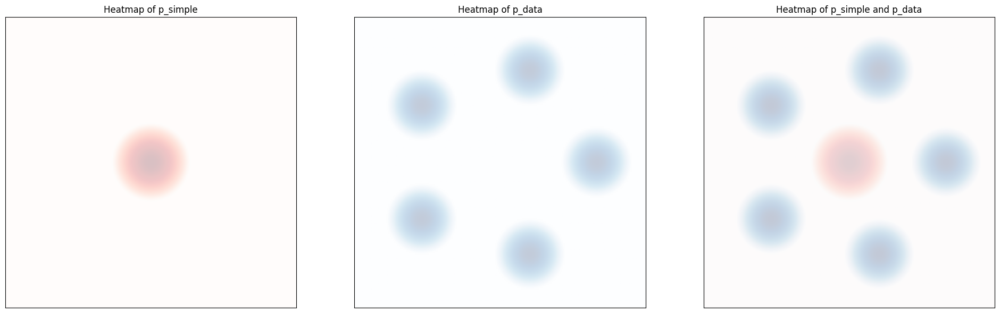

In [3]:
p_simple = Gaussian.isotropic(dim=2, std=1.0).to(device)
p_data = GaussianMixture.symmetric_2D(nmodes=5, std=1.0, scale=10.0).to(device)

fig, axes = plt.subplots(1, 3, figsize=(24, 8))
bins = 200
scale = 15.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

axes[0].set_title('Heatmap of p_simple')
axes[0].set_xticks([])
axes[0].set_yticks([])
imshow_density(density=p_simple, bins=200, scale=15, device=device, ax=axes[0], vmin=-10, alpha=0.25, cmap=plt.get_cmap('Reds'))


axes[1].set_title('Heatmap of p_data')
axes[1].set_xticks([])
axes[1].set_yticks([])
imshow_density(density=p_data, bins=200, scale=15, device=device, ax=axes[1], vmin=-10, alpha=0.25, cmap=plt.get_cmap('Blues'))

axes[2].set_title('Heatmap of p_simple and p_data')
axes[2].set_xticks([])
axes[2].set_yticks([])
imshow_density(density=p_simple, device=device, x_bounds=x_bounds, y_bounds=y_bounds, bins=200, vmin=-10, alpha=0.25, cmap=plt.get_cmap('Reds'))
imshow_density(density=p_data, device=device, x_bounds=x_bounds, y_bounds=y_bounds, bins=200, vmin=-10, alpha=0.25, cmap=plt.get_cmap('Blues'))

In [4]:
class Alpha(ABC):
    def __init__(self):
        assert torch.allclose(self(torch.zeros(1, 1)), torch.zeros(1, 1))
        assert torch.allclose(self(torch.ones(1, 1)), torch.ones(1, 1))
    @abstractmethod
    def __call__(self, t):
        pass
    def dt(self, t):
        t = rearrange(t, 'b d -> b 1 d') # (num_samples, 1, 1)
        dt = vmap(jacrev(self))(t) # (num_samples, 1, 1, 1, 1)
        return rearrange(dt, 'b ... d -> b d')

class Beta(ABC):
    def __init__(self):
        assert torch.allclose(self(torch.zeros(1, 1)), torch.ones(1, 1))
        assert torch.allclose(self(torch.ones(1, 1)), torch.zeros(1, 1))
    @abstractmethod
    def __call__(self, t):
        pass
    def dt(self, t):
        t = rearrange(t, 'b d -> b 1 d')
        dt = vmap(jacrev(self))(t)
        return rearrange(dt, 'b ... d -> b d')

$$\alpha_t = t,\quad \beta_t = \sqrt{1 - t}$$
$$X_t = \psi_t^{\rm{target}}(X_0|z) = \alpha_t z + \beta_t X_0 \sim \mathcal{N}(\alpha_t z, \beta_t^2 I_d)$$
$$u_t(x\mid z) = \dot{\alpha}_t z + \frac{\dot{\beta}_t}{\beta_t} \left( x - \alpha_t z \right) = \left( \dot{\alpha}_t - \frac{\dot{\beta}_t \alpha_t}{\beta_t} \right) z + \frac{\dot{\beta}_t}{\beta_t}x$$
$$\nabla_x \log p_t(x|z) = \nabla_x \log \mathcal{N}(x;\alpha_t z,\beta_t^2 I_d) = \frac{\alpha_t z - x}{\beta_t^2}$$

In [5]:
class LinearAlpha(Alpha):
    def __call__(self, t):
        return t
    def dt(self, t):
        return torch.ones_like(t)

class SquareRootBeta(Beta):
    def __call__(self, t):
        return torch.sqrt(1 - t)
    def dt(self, t):
        return - 0.5 / (torch.sqrt(1 - t))

In [6]:
class GaussianConditionalProbabilityPath(ConditionalProbabilityPath):
    def __init__(self, p_data, alpha, beta):
        p_simple = Gaussian.isotropic(p_data.dim, std=1.0)
        super().__init__(p_simple, p_data)
        self.alpha = alpha
        self.beta = beta
    def sample_conditioning_variable(self, num_samples):
        return self.p_data.sample(num_samples)
    def sample_conditional_path(self, z, t):
        return self.alpha(t) * z + self.beta(t) * torch.randn_like(z)
    def conditional_vector_field(self, x, z, t):
        alpha_t = self.alpha(t)
        beta_t = self.beta(t)
        dt_alpha_t = self.alpha.dt(t)
        dt_beta_t = self.beta.dt(t)
        return dt_alpha_t * z + dt_beta_t / beta_t * (x - alpha_t * z)
    def conditional_score(self, x, z, t):
        alpha_t = self.alpha(t)
        beta_t = self.beta(t)
        return (z * alpha_t - x) / beta_t ** 2

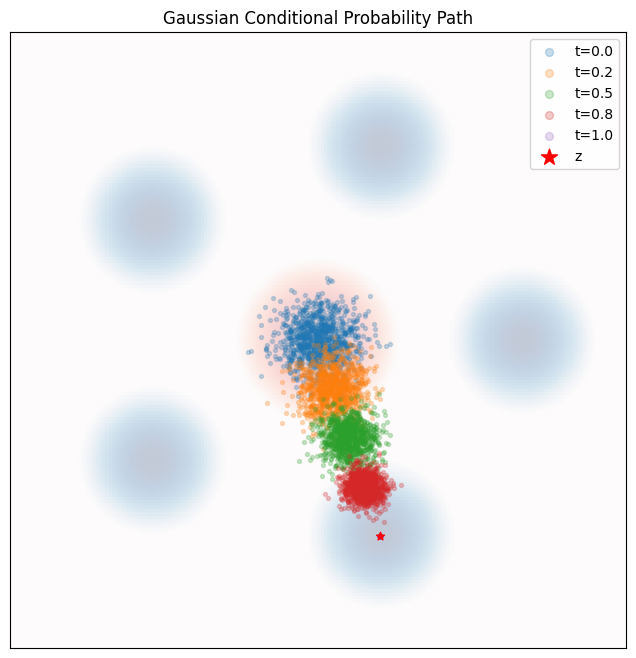

In [7]:
path = GaussianConditionalProbabilityPath(p_data=GaussianMixture.symmetric_2D(nmodes=5, std=1.0, scale=10.0).to(device), alpha=LinearAlpha(), beta=SquareRootBeta()).to(device)

plt.figure(figsize=(8, 8))
plt.xlim(*x_bounds)
plt.ylim(*y_bounds)
plt.xticks([])
plt.yticks([])
plt.title('Gaussian Conditional Probability Path')
imshow_density(density=p_simple, bins=200, scale=15, device=device, vmin=-10, alpha=0.25, cmap=plt.get_cmap('Reds'))
imshow_density(density=p_data, bins=200, scale=15, device=device, vmin=-10, alpha=0.25, cmap=plt.get_cmap('Blues'))

torch.manual_seed(42)
torch.cuda.manual_seed(42)
z = path.sample_conditioning_variable(1)

ts = torch.linspace(0.0, 1.0, 5).to(device)
num_samples = 1000
for t in ts:
    zz = repeat(z, '1 d -> b d', b=num_samples)
    tt = repeat(t, ' -> b 1', b=num_samples)
    samples = path.sample_conditional_path(zz, tt) # (num_samples, 2)
    plt.scatter(samples[:, 0].detach().cpu(), samples[:, 1].detach().cpu(), alpha=0.25, s=8, label=f't={t.item():.1f}')

plt.scatter(z[:, 0].detach().cpu(), z[:, 1].detach().cpu(), marker='*', color='red', label='z')
plt.legend(markerscale=2)
plt.show()

$$dX_t = u_t(X_t|z)dt,\ X_0=x_0 \sim p_{\rm{simple}}$$

In [8]:
class ConditionalVectorFieldODE(ODE):
    def __init__(self, path, z):
        super().__init__()
        self.path = path
        self.z = z
    def drift_coefficient(self, x, t):
        bs = x.shape[0]
        z = repeat(self.z, '1 d -> b d', b=bs)
        return self.path.conditional_vector_field(x, z, t)

Simulating: 100%|██████████| 999/999 [00:00<00:00, 11705.17it/s]


Simulating: 100%|██████████| 999/999 [00:00<00:00, 11705.17it/s]


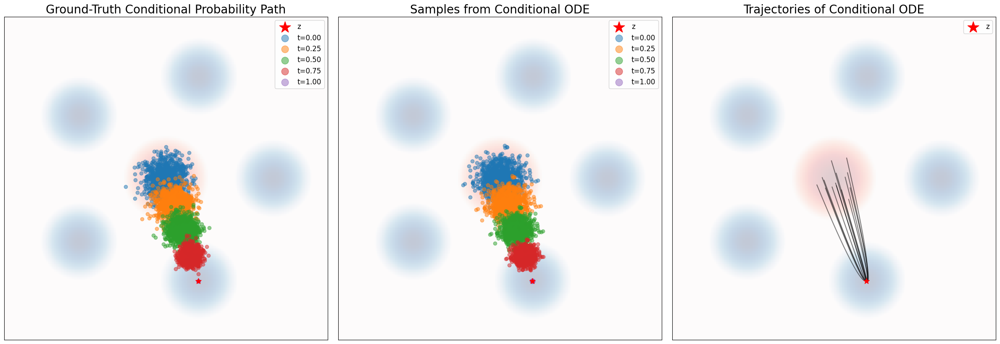

In [9]:
num_samples = 1000
num_timesteps = 1000
num_marginals = 4
scale = 15.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

path = GaussianConditionalProbabilityPath(
    p_data=GaussianMixture.symmetric_2D(nmodes=5, std=1.0, scale=10.0).to(device),
    alpha=LinearAlpha(),
    beta=SquareRootBeta()
).to(device)

torch.manual_seed(42)
z = path.sample_conditioning_variable(1) # (1, 2)
ode = ConditionalVectorFieldODE(path, z)
simulator = EulerSimulator(ode)
x0 = path.p_simple.sample(num_samples) # (num_samples, 2)
ts = torch.linspace(0.0, 1.0, num_timesteps).to(device)
traj_full = simulator.simulate_with_trajectory(x0, ts) # (num_samples, num_timesteps, dim)

fig, axes = plt.subplots(1, 3, figsize=(24, 8))
indices_to_plot = get_trajectory_snapshot_indices(num_timesteps=num_timesteps, step_size=num_timesteps // num_marginals)

ax = axes[0]
ax.set_title('Ground-Truth Conditional Probability Path', fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
ax.scatter(z[:, 0].detach().cpu(), z[:, 1].detach().cpu(), marker='*', color='red', s=100, label='z', zorder=20)
for idx in indices_to_plot:
    t_val = ts[idx]
    tt = repeat(t_val, ' -> b 1', b=num_samples)
    zz = repeat(z, '1 d -> b d', b=num_samples)
    marginal_samples = path.sample_conditional_path(zz, tt)
    ax.scatter(marginal_samples[:, 0].detach().cpu(), marginal_samples[:, 1].detach().cpu(), alpha=0.5, label=f't={t_val.item():.2f}')

ax = axes[1]
ax.set_title('Samples from Conditional ODE', fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
ax.scatter(z[:, 0].detach().cpu(), z[:, 1].detach().cpu(), marker='*', color='red', s=100, label='z', zorder=20)
for idx in indices_to_plot:
    t_val = ts[idx].item()
    points = traj_full[:, idx, :]
    ax.scatter(points[:, 0].detach().cpu(), points[:, 1].detach().cpu(), alpha=0.5, label=f't={t_val:.2f}')

ax = axes[2]
ax.set_title('Trajectories of Conditional ODE', fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
ax.scatter(z[:, 0].detach().cpu(), z[:, 1].detach().cpu(), marker='*', color='red', s=100, label='z', zorder=20)
for traj_idx in range(15):
    ax.plot(traj_full[traj_idx, :, 0].detach().cpu(), traj_full[traj_idx, :, 1].detach().cpu(), alpha=0.5, color='black')

for ax in axes:
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(prop={'size': 12}, loc='upper right', markerscale=2)

plt.tight_layout()
plt.show()

$$d X_t = \left[u_t(X_t|z) + \frac{1}{2}\sigma^2 \nabla_x \log p_t(X_t|z) \right]dt + \sigma\, dW_t, \quad \quad X_0 = x_0 \sim p_{\text{simple}}$$
$$\nabla_x \log p_t(x|z) = \nabla_x N(x;\alpha_t z,\beta_t^2 I_d) = \frac{\alpha_t z - x}{\beta_t^2}$$
$$d X_t = \left[u_t(X_t|z) + \frac{1}{2}\sigma^2 \left(\frac{\alpha_t z - X_t}{\beta_t^2}\right) \right]dt + \sigma\, dW_t.$$

In [10]:
class ConditionalVectorFieldSDE(SDE):
    def __init__(self, path, z, sigma):
        super().__init__()
        self.path = path
        self.z = z
        self.sigma = sigma
    def drift_coefficient(self, x, t):
        bs = x.shape[0]
        z = repeat(self.z, '1 d -> b d', b=bs)
        return self.path.conditional_vector_field(x, z, t) + 0.5 * self.sigma ** 2 * self.path.conditional_score(x, z, t)
    def diffusion_coefficient(self, x, t):
        return torch.full_like(x, self.sigma)

Simulating: 100%|██████████| 999/999 [00:00<00:00, 6028.61it/s]


Simulating: 100%|██████████| 999/999 [00:00<00:00, 6028.61it/s]


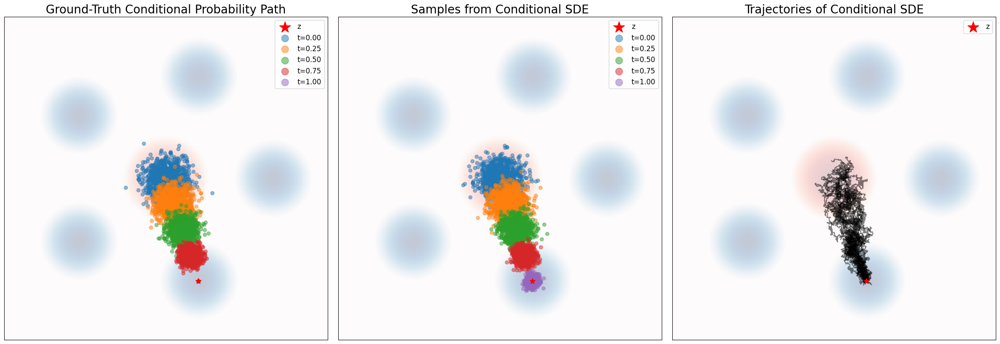

In [11]:
num_samples = 1000
num_timesteps = 1000
num_marginals = 4
sigma = 2.5
scale = 15.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]
path = GaussianConditionalProbabilityPath(
    p_data=GaussianMixture.symmetric_2D(nmodes=5, std=1.0, scale=10.0).to(device),
    alpha=LinearAlpha(),
    beta=SquareRootBeta(),
).to(device)
torch.manual_seed(42)
z = path.sample_conditioning_variable(1)
sde = ConditionalVectorFieldSDE(path, z, sigma)
simulator = EulerMaruyamaSimulator(sde)
x0 = path.p_simple.sample(num_samples)
ts = torch.linspace(0.0, 1.0, num_timesteps).to(device)
traj_full = simulator.simulate_with_trajectory(x0, ts)

fig, axes = plt.subplots(1, 3, figsize=(24, 8))
indices_to_plot = get_trajectory_snapshot_indices(num_timesteps, step_size=num_timesteps // num_marginals)

ax = axes[0]
ax.set_title('Ground-Truth Conditional Probability Path', fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
ax.scatter(z[:, 0].detach().cpu(), z[:, 1].detach().cpu(), marker='*', color='red', s=100, label='z', zorder=20)
for idx in indices_to_plot:
    t_val = ts[idx]
    tt = repeat(t_val, ' -> b 1', b=num_samples)
    zz = repeat(z, '1 d -> b d', b=num_samples)
    marginal_samples = path.sample_conditional_path(zz, tt)
    ax.scatter(marginal_samples[:, 0].detach().cpu(), marginal_samples[:, 1].detach().cpu(), alpha=0.5, label=f't={t_val.item():.2f}')

ax = axes[1]
ax.set_title('Samples from Conditional SDE', fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
ax.scatter(z[:, 0].detach().cpu(), z[:, 1].detach().cpu(), marker='*', color='red', s=100, label='z', zorder=20)
for idx in indices_to_plot:
    t_val = ts[idx].item()
    points = traj_full[:, idx, :]
    ax.scatter(points[:, 0].detach().cpu(), points[:, 1].detach().cpu(), alpha=0.5, label=f't={t_val:.2f}')

ax = axes[2]
ax.set_title('Trajectories of Conditional SDE', fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
ax.scatter(z[:, 0].detach().cpu(), z[:, 1].detach().cpu(), marker='*', color='red', s=100, label='z', zorder=20)
for traj_idx in range(15):
    ax.plot(traj_full[traj_idx, :, 0].detach().cpu(), traj_full[traj_idx, :, 1].detach().cpu(), alpha=0.5, color='black')

for ax in axes:
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(prop={'size': 12}, loc='upper right', markerscale=2)

plt.tight_layout()
plt.show()

$$u_t^{\text{ref}}(x) = \mathbb{E}_{z \sim p_t(z|x)}\left[u_t^{\text{ref}}(x|z)\right]$$
$$ u_t^{\text{ref}}(x) = \argmin_{u_t(x)} \,\,\mathbb{E}_{z \sim p_t(z|x)} \left[\lVert u_t(x) - u_t^{\text{ref}}(x|z)\rVert^2\right]$$
$$u_t^{\theta}(x) \sim u_t^{\text{ref}}$$
**conditional flow matching objective**
$$ \mathcal{L}_{\text{CFM}}(\theta) = \,\,\mathbb{E}_{z \sim p(z), t\in \mathcal{U}[0, 1), x \sim p_t(x|z)} \left[\lVert u_t^{\theta}(x) - u_t^{\text{ref}}(x|z)\rVert^2\right].$$

In [12]:
def build_mlp(dims, activation=torch.nn.SiLU):
    mlp = []
    for idx in range(len(dims) - 1):
        mlp.append(torch.nn.Linear(dims[idx], dims[idx + 1]))
        if idx < len(dims) - 2:
            mlp.append(activation())
    return torch.nn.Sequential(*mlp)

class MLPVectorField(torch.nn.Module):
    def __init__(self, dim, hiddens):
        super().__init__()
        self.dim = dim
        self.net = build_mlp([dim + 1] + hiddens + [dim])
    def forward(self, x, t):
        if t.ndim == 0:
            t = repeat(t, ' -> b 1', b=x.shape[0])
        elif t.ndim == 1:
             t = t.view(-1, 1)
             if t.shape[0] == 1:
                t = t.expand(x.shape[0], 1)
        xt = torch.cat([x, t], dim=-1)
        return self.net(xt)

In [13]:
class Trainer(ABC):
    def __init__(self, model):
        super().__init__()
        self.model = model
    @abstractmethod
    def get_train_loss(self, **kwargs):
        pass
    def get_optimizer(self, lr):
        return torch.optim.Adam(self.model.parameters(), lr=lr)
    def train(self, num_epochs, lr=1e-3, **kwargs):
        self.model.to(device)
        opt = self.get_optimizer(lr)
        self.model.train()
        pbar = tqdm(enumerate(range(num_epochs)))
        for idx, epoch in pbar:
            opt.zero_grad()
            loss = self.get_train_loss(**kwargs)
            loss.backward()
            opt.step()
            pbar.set_description(f'Epoch {idx}, loss: {loss.item()}')
        self.model.eval()

In [14]:
class ConditionalFlowMatchingTrainer(Trainer):
    def __init__(self, path: ConditionalProbabilityPath, model: MLPVectorField, **kwargs):
        super().__init__(model, **kwargs)
        self.path = path

    def get_train_loss(self, batch_size: int) -> torch.Tensor:
        z = self.path.sample_conditioning_variable(batch_size)
        t = torch.rand(batch_size, 1).to(z)
        x = self.path.sample_conditional_path(z, t)
        ut_theta = self.model(x, t)
        ut_ref = self.path.conditional_vector_field(x, z, t)
        loss = torch.sum(torch.square(ut_theta - ut_ref), dim=-1) 
        return torch.mean(loss)

In [15]:
path = GaussianConditionalProbabilityPath(
    p_data=GaussianMixture.symmetric_2D(nmodes=5, std=1.0, scale=10.0).to(device),
    alpha=LinearAlpha(),
    beta=SquareRootBeta(),
).to(device)

flow_model = MLPVectorField(dim=2, hiddens=[64, 64, 64, 64, 64]).to(device)

trainer = ConditionalFlowMatchingTrainer(path=path, model=flow_model)
losses = trainer.train(num_epochs=5000, lr=1e-3, batch_size=1000)

Epoch 4999, loss: 22.302949905395508: : 5000it [00:43, 115.07it/s]


$$dX_t = u_t^{\theta}(x) dt$$

In [16]:
class LearnedVectorFieldODE(ODE):
    def __init__(self, net):
        self.net=net
    def drift_coefficient(self, x, t):
        return self.net(x, t)

Simulating: 100%|██████████| 999/999 [00:00<00:00, 2187.21it/s]


Simulating: 100%|██████████| 999/999 [00:00<00:00, 2187.21it/s]


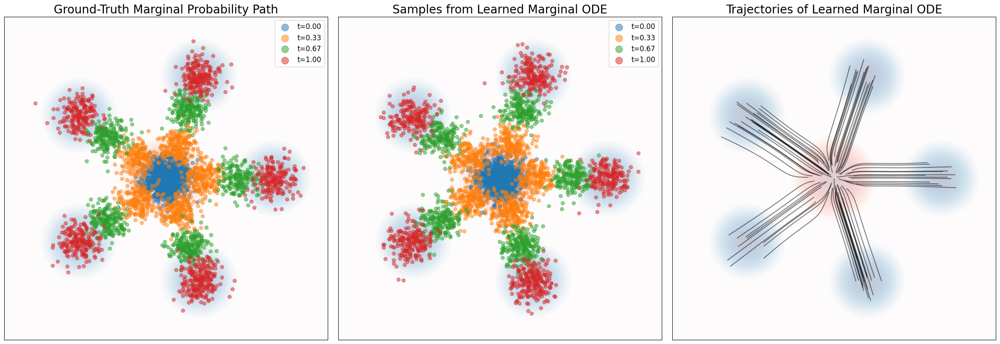

In [17]:
num_samples = 1000
num_timesteps = 1000
num_marginals = 3
scale = 15.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]
markerscale = 2

ode = LearnedVectorFieldODE(flow_model)
simulator = EulerSimulator(ode)

x0 = path.p_simple.sample(num_samples) 
ts = torch.linspace(0.0, 1.0, num_timesteps, device=device)
traj_full = simulator.simulate_with_trajectory(x0, ts) # (num_samples, num_timesteps, dim)

fig, axes = plt.subplots(1, 3, figsize=(24, 8))
indices_to_plot = get_trajectory_snapshot_indices(num_timesteps, step_size=num_timesteps // num_marginals)

ax = axes[0]
ax.set_title("Ground-Truth Marginal Probability Path", fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=path.p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')

for idx in indices_to_plot:
    t_val = ts[idx]
    tt = repeat(t_val, ' -> b 1', b=num_samples)
    marginal_samples = path.sample_marginal_path(tt)
    ax.scatter(marginal_samples[:, 0].detach().cpu(), marginal_samples[:, 1].detach().cpu(), 
               alpha=0.5, label=f't={t_val.item():.2f}')
ax.legend(prop={'size': 12}, loc='upper right', markerscale=2)

ax = axes[1]
ax.set_title("Samples from Learned Marginal ODE", fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=path.p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')

for idx in indices_to_plot:
    t_val = ts[idx].item()
    points = traj_full[:, idx, :]
    ax.scatter(points[:, 0].detach().cpu(), points[:, 1].detach().cpu(), 
               alpha=0.5, label=f't={t_val:.2f}')

ax.legend(prop={'size': 12}, loc='upper right', markerscale=2)

ax = axes[2]
ax.set_title("Trajectories of Learned Marginal ODE", fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=path.p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')

for traj_idx in range(75):
    ax.plot(traj_full[traj_idx, :, 0].detach().cpu(), traj_full[traj_idx, :, 1].detach().cpu(), 
            alpha=0.5, color='black')

for ax in axes:
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()


$$\nabla \log p_t(x) = \mathbb{E}_{z \sim p_t(z|x)}\left[\nabla \log p_t(x|z) \right]$$
$$\nabla \log p_t(x) = \argmin_{s_t(x)} \,\,\mathbb{E}_{z \sim p(z), x \sim p_t(x|z)} \left[\lVert s_t(x) - \nabla \log p_t(x|z)\rVert^2\right]$$
$$s_t^{\theta}(x) \approx \nabla \log p_t(x)$$
**conditional score matching loss**
$$\mathcal{L}_{\text{CSM}}(\theta) \triangleq \mathbb{E}_{t \sim \mathcal{U}[0,1), z \sim p(z), x \sim p_t(x|z)} \left[\lVert s_t^{\theta}(x) - \nabla \log p_t(x|z)\rVert^2\right].$$

In [24]:
class MLPScore(torch.nn.Module):
    def __init__(self, dim, hiddens):
        super().__init__()
        self.dim = dim
        self.net = build_mlp([dim + 1] + hiddens + [dim])
    def forward(self, x, t):
        if t.ndim == 0:
            t = repeat(t, ' -> b 1', b=x.shape[0])
        elif t.ndim == 1:
             t = t.view(-1, 1)
             if t.shape[0] == 1:
                t = t.expand(x.shape[0], 1)
        xt = torch.cat([x, t], dim=-1)
        return self.net(xt)

class ConditionalScoreMatchingTrainer(Trainer):
    def __init__(self, path, model, **kwargs):
        super().__init__(model, **kwargs)
        self.path = path
    def get_train_loss(self, batch_size):
        z = self.path.sample_conditioning_variable(batch_size)
        t = torch.rand(batch_size, 1).to(z)
        x = self.path.sample_conditional_path(z, t)
        s_theta = self.model(x, t)
        s_ref = self.path.conditional_score(x, z, t)
        loss = torch.sum(torch.square(s_theta - s_ref))
        return loss

In [25]:
path = GaussianConditionalProbabilityPath(
    p_data = GaussianMixture.symmetric_2D(nmodes=5, std=1.0, scale=10.0).to(device),
    alpha=LinearAlpha(),
    beta = SquareRootBeta()
).to(device)

score_model = MLPScore(dim=2, hiddens=[64, 64, 64, 64]).to(device)

trainer = ConditionalScoreMatchingTrainer(path, score_model)
losses = trainer.train(num_epochs=5000, lr=1e-3, batch_size=1000)

Epoch 4999, loss: 10697.076171875: : 5000it [00:39, 125.02it/s] 


$$dX_t = \left[u_t^{\theta}(x) + \frac{1}{2}\sigma^2 s_t^{\theta}(x)\right] dt + \sigma d W_t$$

In [26]:
class LangevinFlowSDE(SDE):
    def __init__(self, flow_model, score_model, sigma):
        super().__init__()
        self.flow_model = flow_model
        self.score_model = score_model
        self.sigma = sigma
    def drift_coefficient(self, x, t):
        return self.flow_model(x, t) + 0.5 * self.sigma ** 2 * self.score_model(x, t)
    def diffusion_coefficient(self, x, t):
        return self.sigma * torch.randn_like(x)

Simulating: 100%|██████████| 299/299 [00:00<00:00, 1315.65it/s]


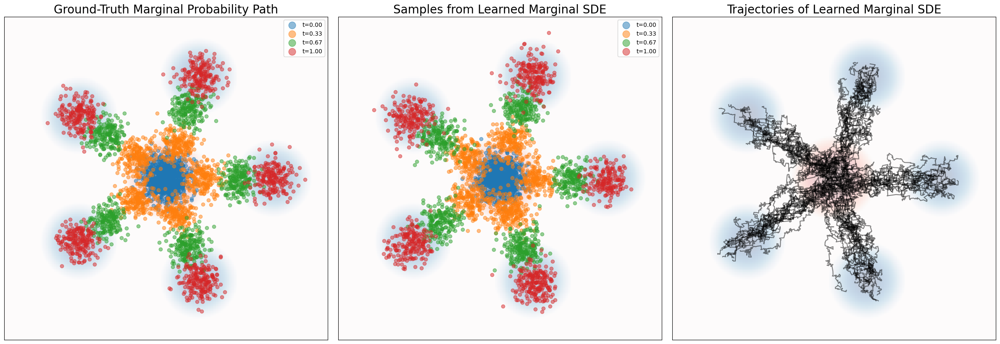

In [30]:
num_samples = 1000
num_timesteps = 300 
num_marginals = 3
scale = 15.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]
sigma = 2.0

sde = LangevinFlowSDE(flow_model, score_model, sigma)
simulator = EulerMaruyamaSimulator(sde)
x0 = path.p_simple.sample(num_samples)
ts = torch.linspace(0.0, 1.0, num_timesteps).to(device)
xts = simulator.simulate_with_trajectory(x0, ts) # (num_samples, num_timesteps, dim)
traj_full = simulator.simulate_with_trajectory(x0, ts) # (num_samples, num_timesteps, dim)
indices_to_plot = get_trajectory_snapshot_indices(num_timesteps, num_timesteps // num_marginals)
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

ax = axes[0]
ax.set_title("Ground-Truth Marginal Probability Path", fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=path.p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
for idx in indices_to_plot:
    t_val = ts[idx]
    tt = repeat(t_val, ' -> b 1', b=num_samples)
    marginal_samples = path.sample_marginal_path(tt)
    ax.scatter(marginal_samples[:,0].detach().cpu(), marginal_samples[:,1].detach().cpu(), 
               marker='o', alpha=0.5, label=f't={t_val.item():.2f}')
ax.legend(markerscale=markerscale)

ax = axes[1]
ax.set_title("Samples from Learned Marginal SDE", fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=path.p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
for idx in indices_to_plot:
    t_val = ts[idx].item()
    points = traj_full[:, idx, :]
    ax.scatter(points[:, 0].detach().cpu(), points[:, 1].detach().cpu(), 
               marker='o', alpha=0.5, label=f't={t_val:.2f}')
ax.legend(markerscale=markerscale)

ax = axes[2]
ax.set_title("Trajectories of Learned Marginal SDE", fontsize=20)
imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
imshow_density(density=path.p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')

for traj_idx in range(75):
    ax.plot(traj_full[traj_idx, :, 0].detach().cpu(), traj_full[traj_idx, :, 1].detach().cpu(), 
            alpha=0.5, color='black')

for ax in axes:
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

$$u_t(x) = \frac{\dot{\alpha}_t}{\alpha_t} x + \left( \frac{\dot{\alpha}_t \beta_t^2 - \alpha_t \dot{\beta}_t \beta_t}{\alpha_t} \right) s_t(x)$$
$$\tilde{s}_t^{\theta}(x) = \frac{u_t^{\theta}(x) - a_tx}{b_t} = \frac{\alpha_t u_t^{\theta}(x) - \dot{\alpha}_t x}{\beta_t^2 \dot{\alpha}_t - \alpha_t \dot{\beta}_t \beta_t}$$
$$\alpha_t = t, \beta_t = \sqrt{1-t}$$
$$\tilde{s}_t^{\theta}(x) = \frac{t u_t^{\theta}(x) - x}{1 - \frac{t}{2}}$$

In [31]:
class ScoreFromVectorField(torch.nn.Module):
    def __init__(self, vector_field, alpha, beta):
        super().__init__()
        self.vector_field = vector_field
        self.alpha = alpha
        self.beta = beta
    def forward(self, x, t):
        alpha_t = self.alpha(t)
        beta_t = self.beta(t)
        dt_alpha_t = self.alpha.dt(t)
        dt_beta_t = self.beta.dt(t)
        u_t = self.vector_field(x, t)
        num = alpha_t * u_t - dt_alpha_t * x
        denom = beta_t ** 2 * dt_alpha_t - alpha_t * dt_beta_t * beta_t
        return num / denom

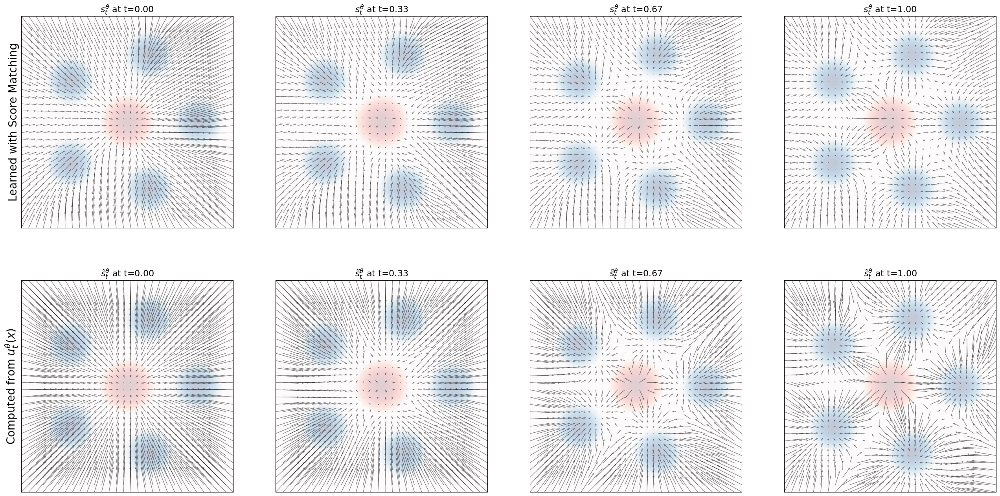

In [39]:
num_bins = 30
num_marginals = 4
scale = 15.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]
ts = torch.linspace(0.0, 0.9999, num_marginals).to(device)

coords = torch.linspace(-scale, scale, num_bins, device=device)
X, Y = torch.meshgrid(coords, coords, indexing='xy')
xy_grid = rearrange([X, Y], 'c h w -> (h w) c')

path = GaussianConditionalProbabilityPath(
    p_data=GaussianMixture.symmetric_2D(nmodes=5, std=1.0, scale=10.0).to(device),
    alpha=LinearAlpha(),
    beta=SquareRootBeta()
).to(device)

learned_score_model = score_model
flow_score_model = ScoreFromVectorField(flow_model, path.alpha, path.beta)

fig, axes = plt.subplots(2, num_marginals, figsize=(8 * num_marginals, 16))
axes = axes.reshape((2, num_marginals))
axes[0, 0].set_ylabel("Learned with Score Matching", fontsize=20)
axes[1, 0].set_ylabel("Computed from $u_t^{\\theta}(x)$", fontsize=20)

for idx in range(num_marginals):
    t = ts[idx]
    bs = num_bins ** 2
    tt = repeat(t, ' -> b 1', b=bs)
    
    ax = axes[0, idx]
    learned_scores = learned_score_model(xy_grid, tt)
    learned_scores_x = learned_scores[:, 0].reshape(num_bins, num_bins)
    learned_scores_y = learned_scores[:, 1].reshape(num_bins, num_bins)
    ax.quiver(
        X.detach().cpu(), Y.detach().cpu(), 
        learned_scores_x.detach().cpu(), learned_scores_y.detach().cpu(), 
        scale=125, alpha=0.5
    )
    imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
    imshow_density(density=path.p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
    ax.set_title(f'$s_{{t}}^{{\\theta}}$ at t={t.item():.2f}', fontsize=16)
    
    ax = axes[1, idx]
    flow_scores = flow_score_model(xy_grid, tt)
    flow_scores_x = flow_scores[:, 0].reshape(num_bins, num_bins)
    flow_scores_y = flow_scores[:, 1].reshape(num_bins, num_bins)
    ax.quiver(
        X.detach().cpu(), Y.detach().cpu(), 
        flow_scores_x.detach().cpu(), flow_scores_y.detach().cpu(), 
        scale=125, alpha=0.5
    )
    imshow_density(density=path.p_simple, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Reds')
    imshow_density(density=path.p_data, bins=200, scale=scale, device=device, ax=ax, vmin=-10, alpha=0.25, cmap='Blues')
    ax.set_title(f'$\\tilde{{s}}_{{t}}^{{\\theta}}$ at t={t.item():.2f}', fontsize=16)

for ax in axes.flatten():
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

In [51]:
class CirclesSampleable(Sampleable):
    def __init__(self, device, noise=0.05, scale=5.0, offset=None):
        self.noise = noise
        self.scale = scale
        self.device = device
        if offset is None:
            offset = torch.zeros(2)
        self.offset = offset.to(device)
    @property
    def dim(self):
        return 2
    def sample(self, num_samples):
        samples, _ = make_circles(n_samples=num_samples, noise=self.noise, factor=0.5, random_state=None)
        return self.scale * torch.from_numpy(samples.astype(np.float32)).to(self.device) + self.offset
        return self.scale * torch.from_numpy(samples).to(dtype=torch.float32, device=self.device) + self.offset

class MoonsSampleable(Sampleable):
    def __init__(self, device, noise=0.05, scale=5.0, offset=None):
        self.noise = noise
        self.scale = scale
        self.device = device
        if offset is None:
            offset = torch.zeros(2)
        self.offset = offset.to(device)
    @property
    def dim(self):
        return 2
    def sample(self, num_samples):
        samples, _ = make_moons(n_samples=num_samples, noise=self.noise, random_state=None)
        return self.scale * torch.from_numpy(samples).to(dtype=torch.float32, device=self.device) + self.offset

class CheckerboardSampleable(Sampleable):
    def __init__(self, device, grid_size=3, scale=5.0):
        self.grid_size = grid_size
        self.scale = scale
        self.device = device
    @property
    def dim(self):
        return 2
    def sample(self, num_samples):
        grid_length = 2 * self.scale / self.grid_size
        samples = torch.zeros(0, 2).to(self.device)
        while samples.shape[0] < num_samples:
            new_samples = (torch.rand(num_samples, 2).to(self.device) - 0.5) * 2 * self.scale
            x_mask = torch.floor((new_samples[:, 0] + self.scale) / grid_length) % 2 == 0 # (num_samples,)
            y_mask = torch.floor((new_samples[:, 1] + self.scale) / grid_length) % 2 == 0 # (num_samples,)
            accept_mask = torch.logical_xor(~x_mask, y_mask)
            samples = torch.cat([samples, new_samples[accept_mask]], dim=0)
        return samples[:num_samples]

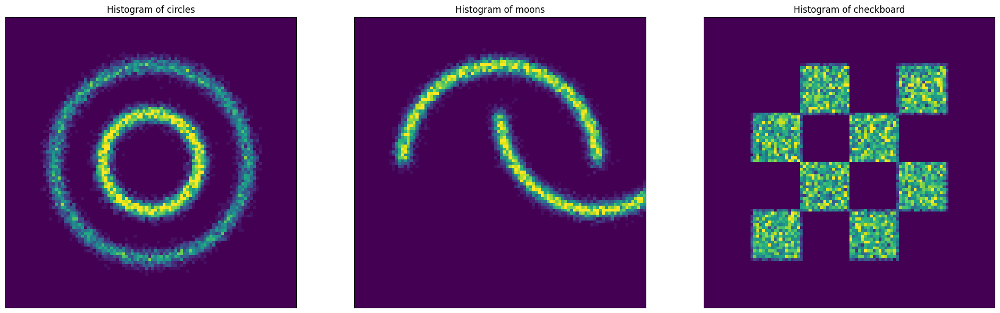

In [52]:
targets = {
    "circles": CirclesSampleable(device),
    "moons": MoonsSampleable(device),
    "checkboard": CheckerboardSampleable(device, grid_size=4)
}

fig, axes = plt.subplots(1, 3, figsize=(8 * len(targets), 8))

num_samples = 20000
num_bins = 100
for idx, (target_name, target) in enumerate(targets.items()):
    ax = axes[idx]
    hist2d_sampleable(target, num_samples=num_samples, bins=num_bins, scale=7.5, ax=ax)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Histogram of {target_name}')

plt.show()


$$X_t = (1-t) X_0 + t z,\ X_0 = \frac{X_t - t z}{1-t}$$
$$X_0 \sim p_{\text{simple}},\ z \sim p_{\text{data}}$$
$$p_0(x\mid z) = p_{\text{simple}}(x),\ p_1(x\mid z) = \delta_z(x)$$
$$\frac{d}{dt} X_t = \frac{d}{dt} ((1-t) X_0 + t z) = -X_0 + z = z - \left( \frac{X_t - t z}{1-t} \right) = \frac{z(1-t) - (X_t - t z)}{1-t} = \frac{z - t z - X_t + t z}{1-t} = \frac{z - X_t}{1-t}$$
$$u_t^{\text{ref}}(x \mid z) = \frac{z - x}{1-t}$$

In [53]:
class LinearConditionalProbabilityPath(ConditionalProbabilityPath):
    def __init__(self, p_simple, p_data):
        super().__init__(p_simple, p_data)
    def sample_conditioning_variable(self, num_samples):
        return self.p_data.sample(num_samples)
    def sample_conditional_path(self, z, t):
        x0 = self.p_simple.sample(z.shape[0])
        xt = (1 - t) * x0 + t * z
        return xt
    def conditional_vector_field(self, x, z, t):
        return (z - x) / (1 - t)
    def conditional_score(self, x, z, t):
        pass

Simulating: 100%|██████████| 499/499 [00:00<00:00, 25570.03it/s]


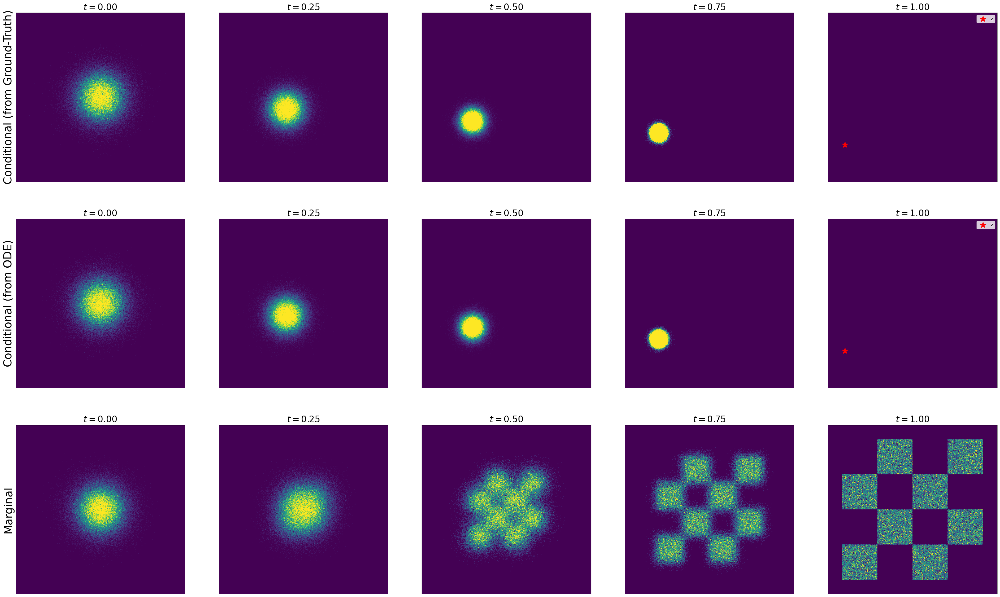

In [57]:
num_samples = 100000
num_timesteps = 500
num_marginals = 5
scale = 6.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

path = LinearConditionalProbabilityPath(
    p_simple=Gaussian.isotropic(dim=2, std=1.0),
    p_data=CheckerboardSampleable(device, grid_size=4)
).to(device)

z = path.sample_conditioning_variable(1)  # (1, 2)

ts = torch.linspace(0.0, 1.0, num_timesteps).to(device)
indices_to_plot = get_trajectory_snapshot_indices(num_timesteps, num_timesteps // (num_marginals - 1))

fig, axes = plt.subplots(3, num_marginals, figsize=(8 * num_marginals, 24))
axes = axes.reshape(3, num_marginals)

axes[0, 0].set_ylabel("Conditional (from Ground-Truth)", fontsize=25)
for idx, time_idx in enumerate(indices_to_plot):
    t_val = ts[time_idx]
    tt = repeat(t_val, ' -> b 1', b=num_samples)
    zz = repeat(z, '1 d -> b d', b=num_samples)
    samples = path.sample_conditional_path(zz, tt)
    ax = axes[0, idx]
    hist2d_samples(samples=samples.cpu(), ax=ax, bins=300, scale=scale, percentile=99, alpha=1.0)
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'$t={t_val.item():.2f}$', fontsize=20)
axes[0, -1].scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker='*', color='red', s=200, label='z', zorder=20)
axes[0, -1].legend()


axes[1, 0].set_ylabel("Conditional (from ODE)", fontsize=25)
ode = ConditionalVectorFieldODE(path, z)
simulator = EulerSimulator(ode)
x0 = path.p_simple.sample(num_samples)
traj_full = simulator.simulate_with_trajectory(x0, ts)  # (num_samples, num_timesteps, dim)
for idx, time_idx in enumerate(indices_to_plot):
    t_val = ts[time_idx]
    points = traj_full[:, time_idx, :]  # (num_samples, 2)
    ax = axes[1, idx]
    hist2d_samples(samples=points.cpu(), ax=ax, bins=300, scale=scale, percentile=99, alpha=1.0)
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'$t={t_val.item():.2f}$', fontsize=20)
axes[1, -1].scatter(z[:, 0].cpu(), z[:, 1].cpu(), marker='*', color='red', s=200, label='z', zorder=20)
axes[1, -1].legend()

axes[2, 0].set_ylabel("Marginal", fontsize=25)
for idx, time_idx in enumerate(indices_to_plot):
    t_val = ts[time_idx]
    tt = repeat(t_val, ' -> b 1', b=num_samples)
    marginal_samples = path.sample_marginal_path(tt)
    ax = axes[2, idx]
    hist2d_samples(samples=marginal_samples.cpu(), ax=ax, bins=300, scale=scale, percentile=99, alpha=1.0)
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'$t={t_val.item():.2f}$', fontsize=20)

plt.show()


In [59]:
path = LinearConditionalProbabilityPath(
    p_simple=Gaussian.isotropic(dim=2, std=1.0),
    p_data=CheckerboardSampleable(device, grid_size=4)
).to(device)
linear_flow_model = MLPVectorField(dim=2, hiddens=[64, 64, 64, 64]).to(device)
trainer = ConditionalFlowMatchingTrainer(path, linear_flow_model)
losses = trainer.train(num_epochs=10000, lr=1e-3, batch_size=2000)

0it [00:00, ?it/s]

Epoch 9999, loss: 8.779423713684082: : 10000it [02:04, 80.48it/s]


Simulating: 100%|██████████| 99/99 [00:00<00:00, 273.29it/s]


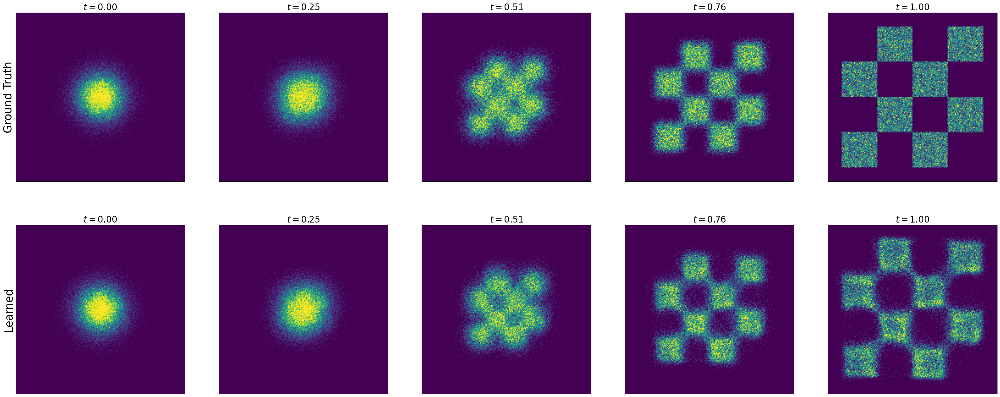

In [61]:
num_samples = 50000
num_marginals = 5
num_timesteps = 100
scale = 6.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]
fig, axes = plt.subplots(2, num_marginals, figsize=(8 * num_marginals, 16))
axes = axes.reshape(2, num_marginals)
ts = torch.linspace(0.0, 1.0, num_timesteps).to(device)
indices_to_plot = get_trajectory_snapshot_indices(num_timesteps, num_timesteps // (num_marginals - 1))

axes[0, 0].set_ylabel("Ground Truth", fontsize=25)
for idx, time_idx in enumerate(indices_to_plot):
    t_val = ts[time_idx]
    tt = repeat(t_val, ' -> b 1', b=num_samples)
    marginal_samples = path.sample_marginal_path(tt)
    
    ax = axes[0, idx]
    hist2d_samples(samples=marginal_samples.cpu(), ax=ax, bins=200, scale=scale, percentile=99, alpha=1.0)
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'$t={t_val.item():.2f}$', fontsize=20)

axes[1, 0].set_ylabel("Learned", fontsize=25)
ode = LearnedVectorFieldODE(linear_flow_model)
simulator = EulerSimulator(ode)
x0 = path.p_simple.sample(num_samples)
traj_full = simulator.simulate_with_trajectory(x0, ts)  # (num_samples, num_timesteps, dim)
for idx, time_idx in enumerate(indices_to_plot):
    t_val = ts[time_idx]
    points = traj_full[:, time_idx, :]  # (num_samples, 2)
    ax = axes[1, idx]
    hist2d_samples(samples=points.cpu(), ax=ax, bins=200, scale=scale, percentile=99, alpha=1.0)
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'$t={t_val.item():.2f}$', fontsize=20)

plt.show()

In [62]:
path = LinearConditionalProbabilityPath(
    p_simple = CirclesSampleable(device),
    p_data = CheckerboardSampleable(device, grid_size=4)
).to(device)
bridging_flow_model = MLPVectorField(dim=2, hiddens=[100,100,100,100])
trainer = ConditionalFlowMatchingTrainer(path, bridging_flow_model)
losses = trainer.train(num_epochs=20000, lr=1e-3, batch_size=2000)

Epoch 19999, loss: 21.882869720458984: : 20000it [04:27, 74.81it/s]


Simulating: 100%|██████████| 199/199 [00:00<00:00, 237.31it/s]


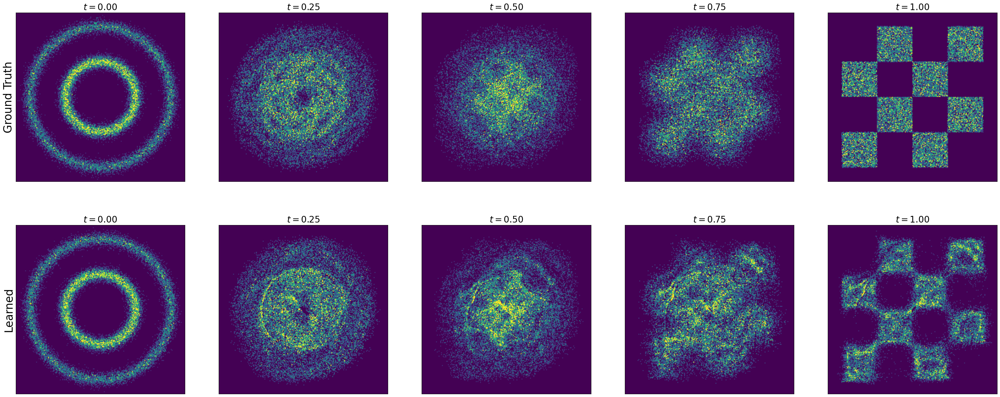

In [63]:
num_samples = 30000
num_marginals = 5
num_timesteps = 200
scale = 6.0
x_bounds = [-scale, scale]
y_bounds = [-scale, scale]

fig, axes = plt.subplots(2, num_marginals, figsize=(8 * num_marginals, 16))
axes = axes.reshape(2, num_marginals)
ts = torch.linspace(0.0, 1.0, num_timesteps).to(device)
indices_to_plot = get_trajectory_snapshot_indices(num_timesteps, num_timesteps // (num_marginals - 1))

axes[0, 0].set_ylabel("Ground Truth", fontsize=25)
for idx, time_idx in enumerate(indices_to_plot):
    t_val = ts[time_idx]
    tt = repeat(t_val, ' -> b 1', b=num_samples)
    marginal_samples = path.sample_marginal_path(tt)
    ax = axes[0, idx]
    hist2d_samples(samples=marginal_samples.cpu(), ax=ax, bins=200, scale=scale, percentile=99, alpha=1.0)
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'$t={t_val.item():.2f}$', fontsize=20)

axes[1, 0].set_ylabel("Learned", fontsize=25)
ode = LearnedVectorFieldODE(bridging_flow_model)
simulator = EulerSimulator(ode)
x0 = path.p_simple.sample(num_samples)
traj_full = simulator.simulate_with_trajectory(x0, ts)  # (num_samples, num_timesteps, dim)

for idx, time_idx in enumerate(indices_to_plot):
    t_val = ts[time_idx]
    points = traj_full[:, time_idx, :]  # (num_samples, 2)
    ax = axes[1, idx]
    hist2d_samples(samples=points.cpu(), ax=ax, bins=200, scale=scale, percentile=99, alpha=1.0)
    ax.set_xlim(*x_bounds)
    ax.set_ylim(*y_bounds)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'$t={t_val.item():.2f}$', fontsize=20)

plt.show()